In [16]:
from visual_behavior import utilities as vbu
import visual_behavior.plotting as vbp
from visual_behavior.utilities import EyeTrackingData
from visual_behavior import database as db
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import time
import seaborn as sns
import matplotlib.patches as patches

import glob

from scipy import stats

from multiprocessing import Pool

from dro.modules import eye_tracking as et
from dro.modules import plotting as plot_utils

import warnings
warnings.filterwarnings("ignore")

In [2]:
%matplotlib notebook
%widescreen

In [3]:
osid = 939868908
ed = et.open_eye_data(osid)

opening eye data for osid = 939868908


In [8]:
def get_raw_points(osid):
    raw_points = pd.read_hdf(glob.glob('/allen/aibs/technology/waynew/eye/phase3/29intermediate/{}*1030000.h5'.format(osid))[0])
    return raw_points

In [19]:
def make_plot(ed, initial_frame):
    raw_points = get_raw_points(osid)
    fig,ax=plt.subplots(1,5,figsize=(15,3))

    
    for ii,frame in enumerate(range(initial_frame-2,initial_frame+3)):
        ax[ii].imshow(ed.get_annotated_frame(frame))

        pupil_columns = sorted([c for c in np.unique(np.array(raw_points.columns.get_level_values(1))) if c.startswith('pupil')])
        palette = sns.color_palette("hls", len(pupil_columns))
        for c,pupil_column in enumerate(pupil_columns):
            dft = raw_points[raw_points.columns.get_level_values(0)[0]][pupil_column]
            ax[ii].plot(dft.loc[frame]['x'],dft.loc[frame]['y'],marker='o',color='blue',alpha=0.75,markersize=8)

        eye_columns = sorted([c for c in np.unique(np.array(raw_points.columns.get_level_values(1))) if c.startswith('eye')])
        palette = sns.color_palette("hls", len(eye_columns))
        for c,eye_column in enumerate(eye_columns):
            dft = raw_points[raw_points.columns.get_level_values(0)[0]][eye_column]
            ax[ii].plot(dft.loc[frame]['x'],dft.loc[frame]['y'],marker='o',color='red',alpha=0.75,markersize=8)

        ax[ii].set_title('frame = {}'.format(frame))
        ax[ii].axis('off')
    fig.tight_layout()
    plt.subplots_adjust(top=0.9,hspace=0,wspace=0)
    fig.suptitle('ophys_session_id = {}'.format(osid))
    return fig,ax

789220000


<IPython.core.display.Javascript object>


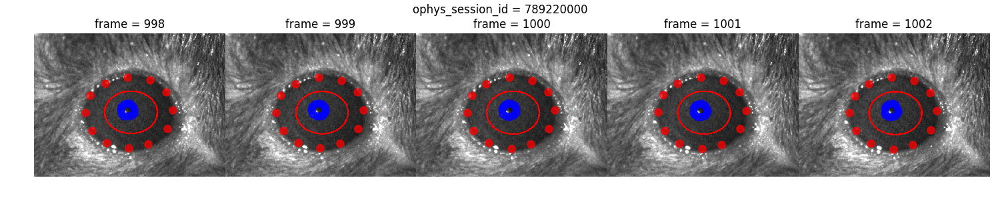

798818118


<IPython.core.display.Javascript object>


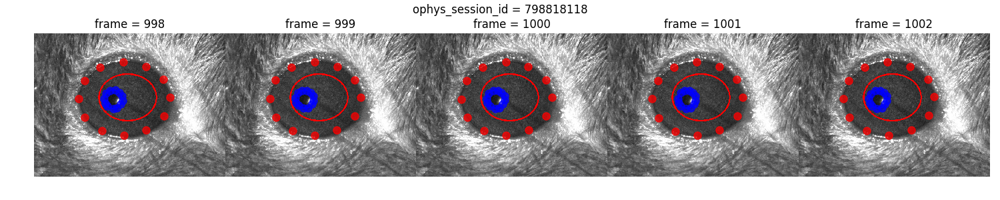

898870044


<IPython.core.display.Javascript object>


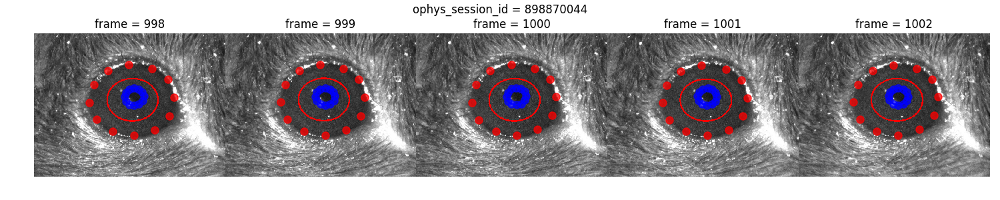

820871900


<IPython.core.display.Javascript object>


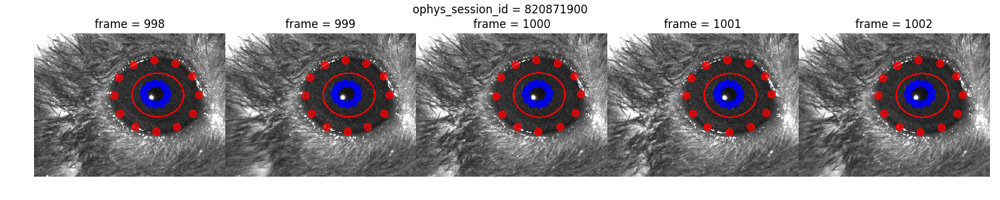

829521794


<IPython.core.display.Javascript object>


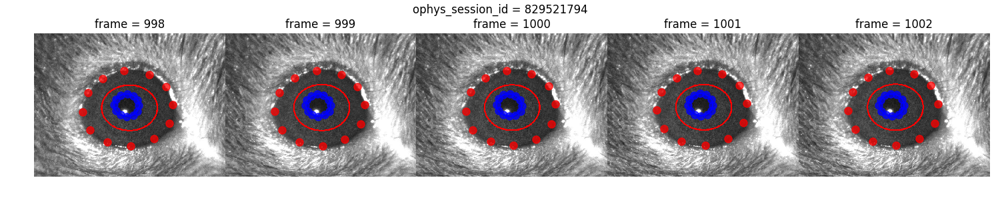

881236651


<IPython.core.display.Javascript object>


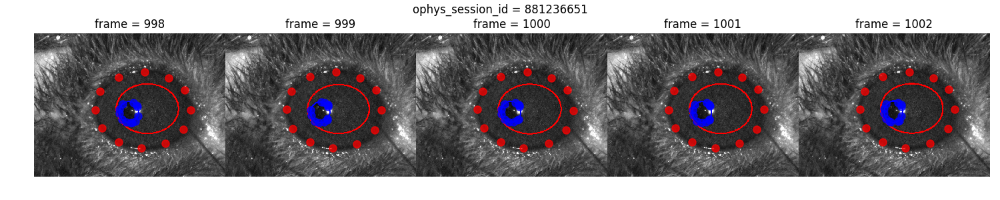

841303580


<IPython.core.display.Javascript object>


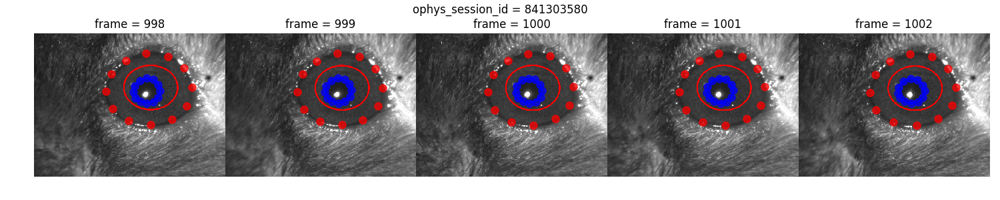

796018019


<IPython.core.display.Javascript object>


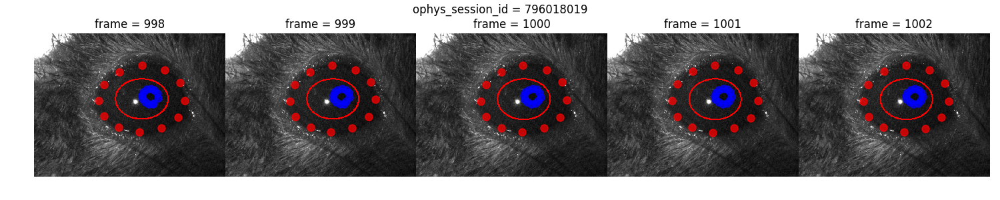

809393834


<IPython.core.display.Javascript object>


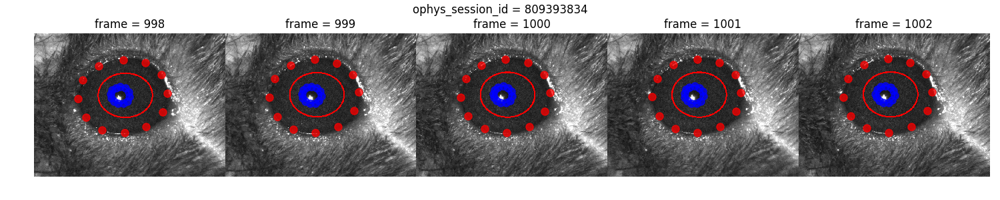

848253761


<IPython.core.display.Javascript object>


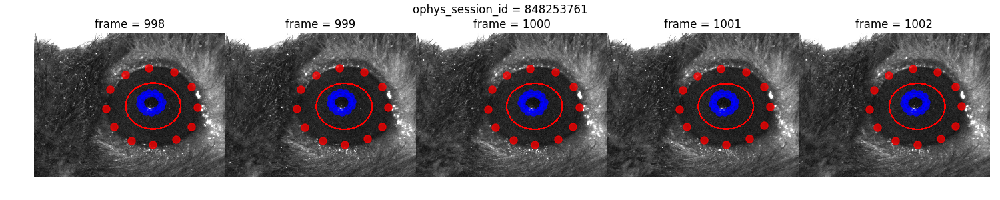

795625712


<IPython.core.display.Javascript object>


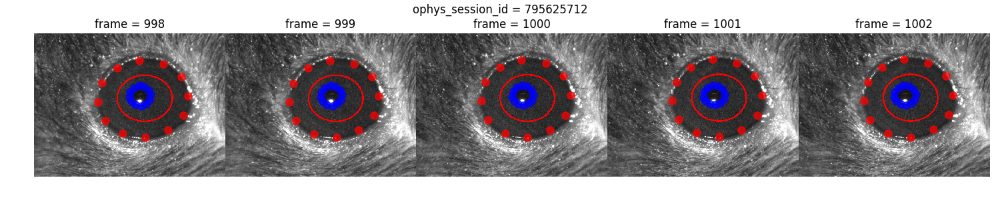

808107961


<IPython.core.display.Javascript object>


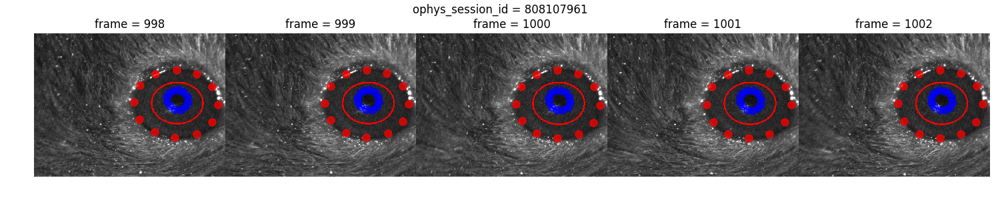

846599329


<IPython.core.display.Javascript object>


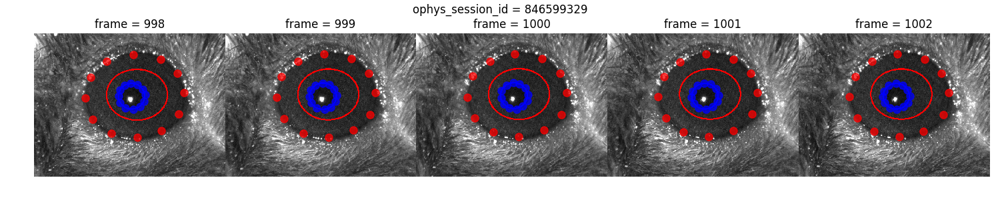

903711544


<IPython.core.display.Javascript object>


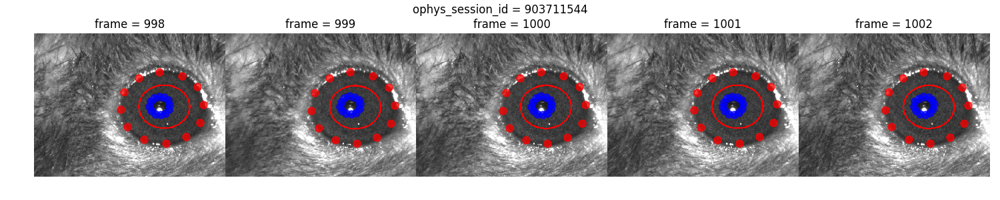

893937838


<IPython.core.display.Javascript object>


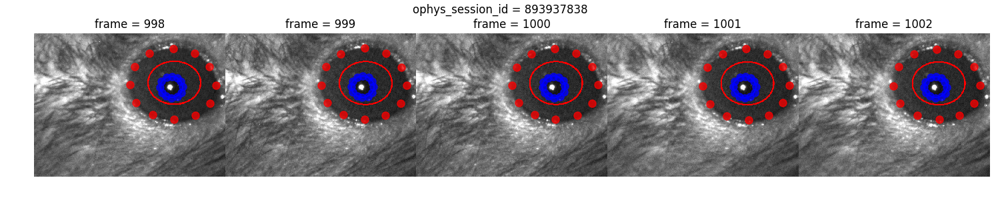

833705055


<IPython.core.display.Javascript object>


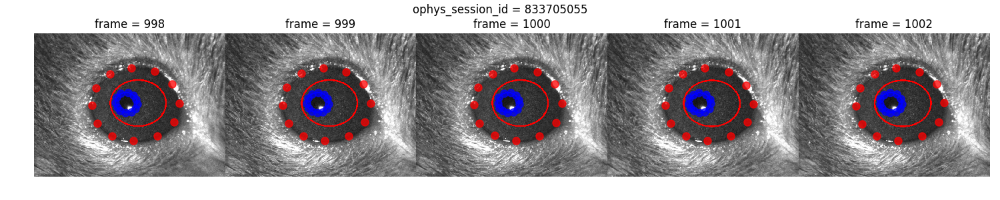

915587736


<IPython.core.display.Javascript object>


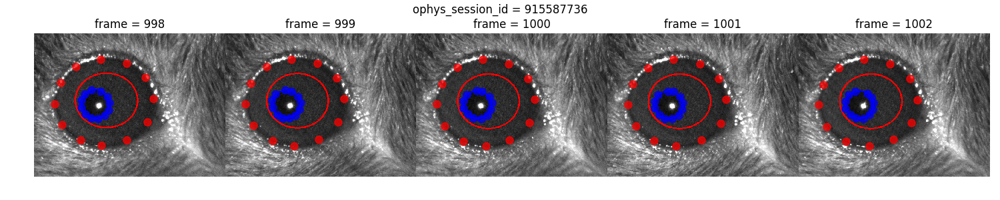

795866393


<IPython.core.display.Javascript object>


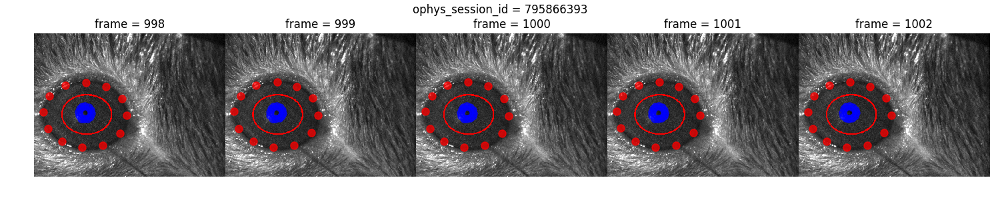

853416014


<IPython.core.display.Javascript object>


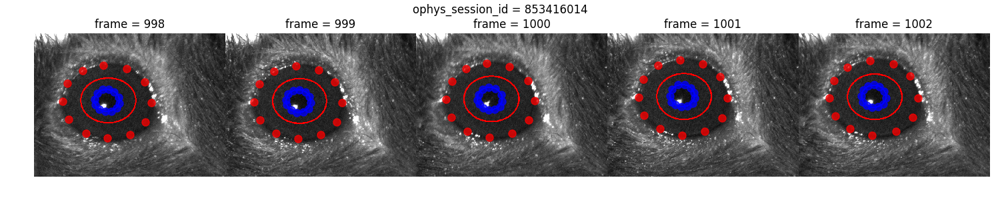

907757569


<IPython.core.display.Javascript object>


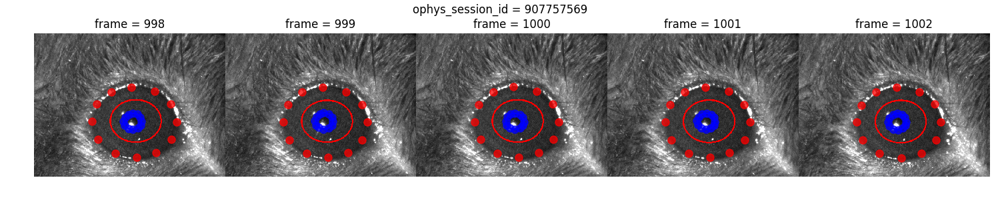

808092249


<IPython.core.display.Javascript object>


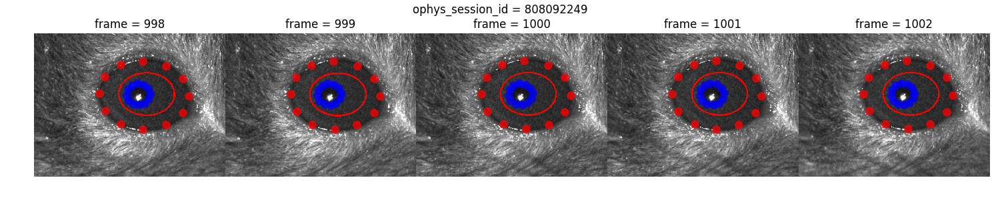

855353286


<IPython.core.display.Javascript object>


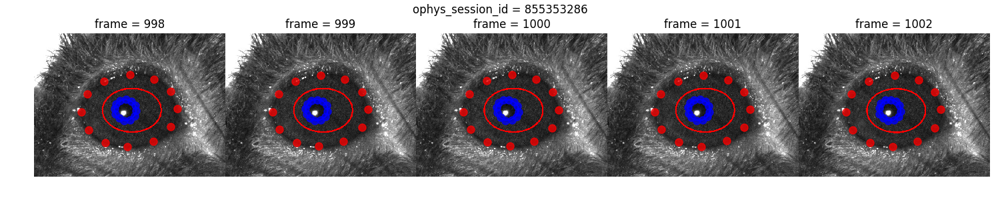

851438454


<IPython.core.display.Javascript object>


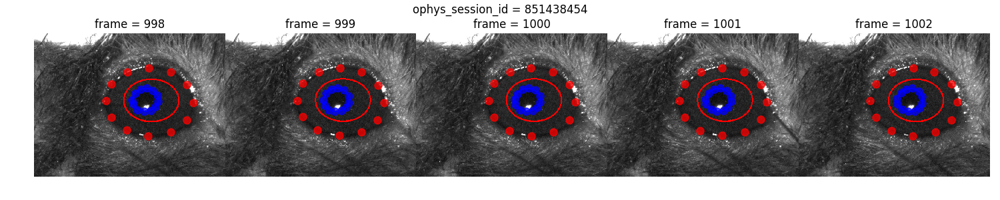

807055274


<IPython.core.display.Javascript object>


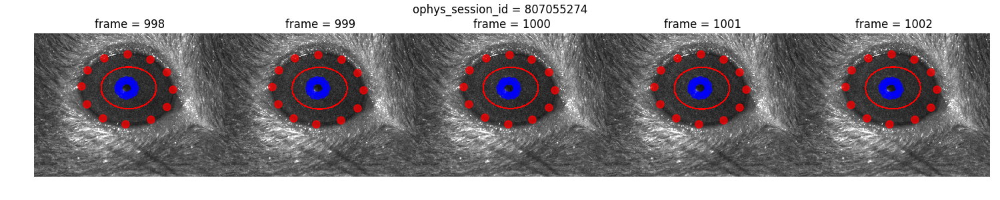

911449165


<IPython.core.display.Javascript object>


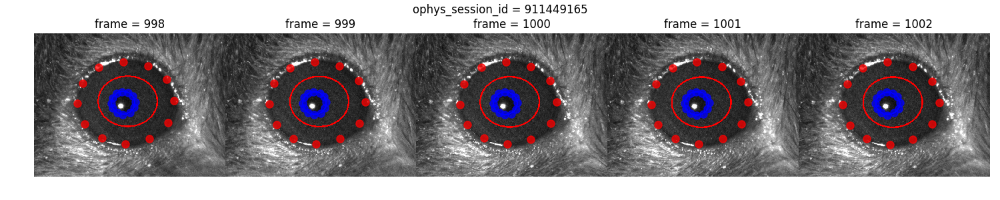

914163299


<IPython.core.display.Javascript object>


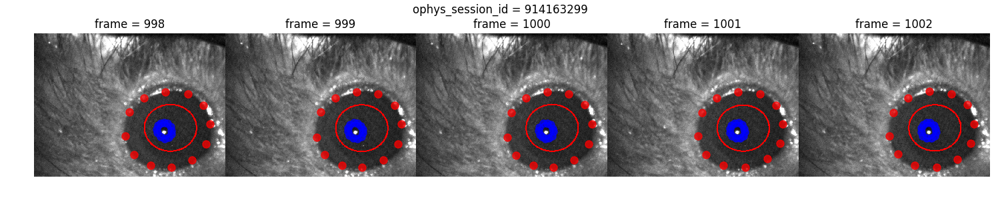

855762043


<IPython.core.display.Javascript object>


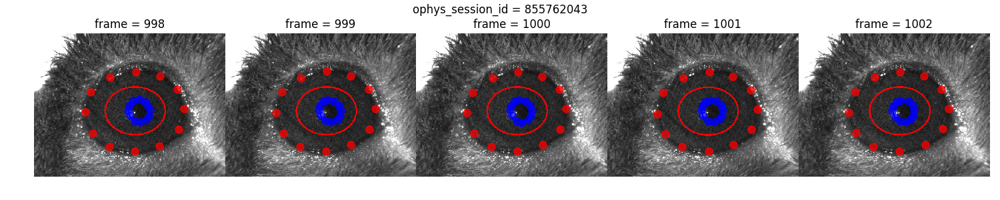

803223329


<IPython.core.display.Javascript object>


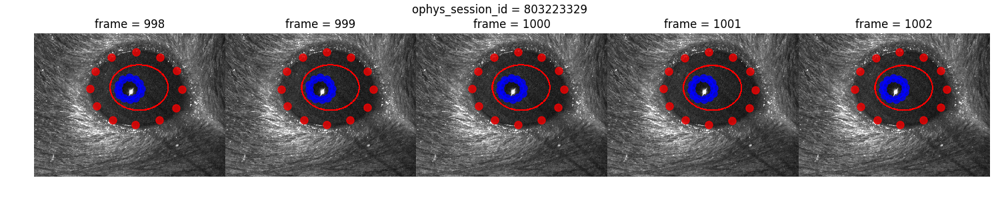

793857113


<IPython.core.display.Javascript object>


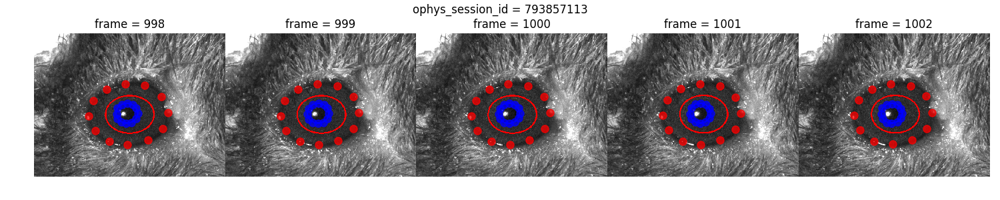

In [25]:
ellipse_filenames = glob.glob('/allen/aibs/technology/waynew/eye/phase3/29intermediate/*_ellipse.h5')
for ellipse_filename in ellipse_filenames:
    osid = os.path.split(ellipse_filename)[1][:9]
    raw_points = get_raw_points(osid)
    print(osid)
    ed = EyeTrackingData(osid, ellipse_fit_path = ellipse_filename, data_source='filesystem')
    fig,ax = make_plot(ed, initial_frame = 1000);
    fig.savefig('/allen/aibs/technology/waynew/eye/phase3/29intermediate/plots/{}.png'.format(osid),dpi=300)
    